<a href="https://colab.research.google.com/github/minsungk02/3D_objectdetection/blob/minsung/nuscenes_devkit(pointpillars).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import shutil
import tarfile
import glob

# ------------------------------------------------------------------
# [설정] 경로
# ------------------------------------------------------------------
TGZ_PATH = "/content/drive/MyDrive/LIKE_LION/1st_project(3D object detection)/v1.0-mini.tgz"
EXTRACT_DIR = "/content/nuscenes"

# 1. 기존 폴더 삭제 (Clean Slate)
if os.path.exists(EXTRACT_DIR):
    print(f"🗑️ 기존 {EXTRACT_DIR} 폴더 삭제 중...")
    shutil.rmtree(EXTRACT_DIR)
    print("✅ 삭제 완료!")

# 2. 압축 해제
print(f"📦 {TGZ_PATH} 압축 해제 시작... (약 1~2분 소요)")
os.makedirs(EXTRACT_DIR, exist_ok=True)

try:
    with tarfile.open(TGZ_PATH, 'r:gz') as tar:
        tar.extractall(path=EXTRACT_DIR)
    print("✅ 압축 해제 완료!")
except Exception as e:
    print(f"❌ 압축 해제 실패: {e}")

# 3. 폴더 구조 확인 및 이동 (중요!)
# 가끔 압축을 풀면 /content/nuscenes/v1.0-mini/samples/... 처럼 될 때가 있습니다.
# 우리는 /content/nuscenes/samples/... 가 필요합니다.

# samples 폴더가 어디 있는지 찾기
found_samples = glob.glob(f"{EXTRACT_DIR}/**/samples", recursive=True)

if not found_samples:
    print("❌ Error: 'samples' 폴더를 찾을 수 없습니다! 압축 파일이 손상되었거나 구조가 이상합니다.")
else:
    actual_samples_path = found_samples[0]
    print(f"🔎 'samples' 폴더 발견 위치: {actual_samples_path}")

    # 만약 경로가 이상하면 (예: nuscenes/v1.0-mini/samples) -> nuscenes/samples로 이동
    parent_dir = os.path.dirname(actual_samples_path)
    if parent_dir != EXTRACT_DIR.rstrip('/'):
        print("⚠️ 폴더 구조 교정 중... (Nested Folder Fix)")
        # 내용물을 상위로 이동
        for item in os.listdir(parent_dir):
            shutil.move(os.path.join(parent_dir, item), EXTRACT_DIR)
        print("✅ 폴더 구조 교정 완료!")

# 4. 최종 파일 확인 (CAM_FRONT 이미지가 있는지)
cam_front_files = glob.glob(f"{EXTRACT_DIR}/samples/CAM_FRONT/*.jpg")
print(f"📸 확인된 CAM_FRONT 이미지 개수: {len(cam_front_files)}개")

if len(cam_front_files) > 0:
    print("🎉 데이터셋 준비 완료! 이제 시각화 코드를 다시 실행해보세요.")
else:
    print("❌ CAM_FRONT 이미지가 여전히 없습니다. v1.0-mini.tgz 파일 자체를 확인해봐야 합니다.")

📦 /content/drive/MyDrive/LIKE_LION/1st_project(3D object detection)/v1.0-mini.tgz 압축 해제 시작... (약 1~2분 소요)


/tmp/ipython-input-4228032745.py:24: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=EXTRACT_DIR)


✅ 압축 해제 완료!
🔎 'samples' 폴더 발견 위치: /content/nuscenes/samples
📸 확인된 CAM_FRONT 이미지 개수: 404개
🎉 데이터셋 준비 완료! 이제 시각화 코드를 다시 실행해보세요.


# 2️⃣ 시각화 코드 실행 (JSON 로드)

# 이미지(2D) + 라이다(3D맵)

In [2]:
# 필수 라이브러리 설치 , 끝나면 재실행!
!pip install nuscenes-devkit plotly pandas matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.2 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of opencv-python-headless to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.0/316.0 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 94.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 95.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 14.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: Shapely
    Found existing installation: shapely 2.1.2
    Uninstalling shapely-2.1.2:
      Successfully uninstalled shapely-2.1.2
  Attempting uninstall: opencv-python-headless
    Found exi

# 🔴 PointPillars 샘플 시각화(CAM 6개 + Lidar 3D MAP)

⏳ NuScenes 데이터 로딩 중...
✅ 준비 완료!
📸 Dashboard for Sample: b4ff30109dd14c89b24789dc5713cf8c


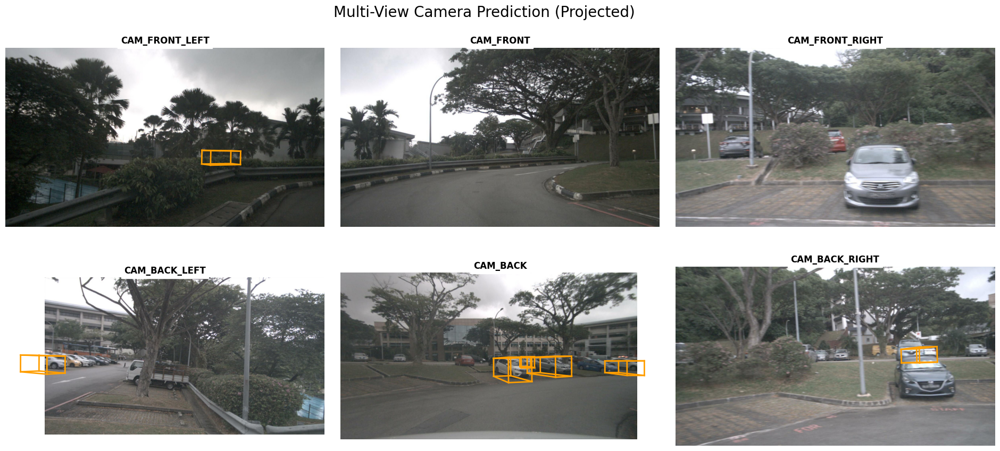

In [ ]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import plotly.graph_objects as go
from nuscenes import NuScenes
from nuscenes.utils.data_classes import Box
from pyquaternion import Quaternion
from nuscenes.utils.geometry_utils import view_points, box_in_image, BoxVisibility

# ------------------------------------------------------------------------------
# 1. 환경 설정 (경로 확인 필수!)
# ------------------------------------------------------------------------------
DATA_ROOT = '/content/nuscenes'
JSON_PATH = "/content/drive/MyDrive/nuscenes_outputs/final_best_results2/results_nusc/pred_instances_3d/results_nusc.json"
VERSION = 'v1.0-mini'

# NuScenes 로드
print("⏳ NuScenes 데이터 로딩 중...")
nusc = NuScenes(version=VERSION, dataroot=DATA_ROOT, verbose=False)
with open(JSON_PATH, 'r') as f:
    results = json.load(f)['results']
print("✅ 준비 완료!")

# ------------------------------------------------------------------------------
# 2. 색상표 (에러 방지 & 시각적 구분)
# ------------------------------------------------------------------------------
COLOR_MAP = {
    'car': (255, 158, 0), 'truck': (255, 99, 71), 'trailer': (255, 140, 0),
    'bus': (255, 127, 80), 'construction_vehicle': (233, 150, 122),
    'bicycle': (220, 20, 60), 'motorcycle': (255, 61, 99),
    'pedestrian': (0, 0, 230), 'traffic_cone': (47, 79, 79), 'barrier': (112, 128, 144)
}

def get_color(name, mode='rgb'):
    c = COLOR_MAP.get(name, (128, 128, 128))
    if mode == 'rgb': return np.array(c) / 255.0
    return f'rgb({c[0]},{c[1]},{c[2]})'

# ------------------------------------------------------------------------------
# 3. 좌표 변환 헬퍼 함수 (이게 핵심입니다!)
# ------------------------------------------------------------------------------
def get_boxes_in_sensor_frame(sample_token, sensor_token):
    """
    Global 좌표계의 예측 박스를 -> 특정 센서(카메라/라이다)의 시점 및 시간으로 완벽하게 변환합니다.
    """
    # 1. 센서 데이터 및 포즈 가져오기
    sd_record = nusc.get('sample_data', sensor_token)
    cs_record = nusc.get('calibrated_sensor', sd_record['calibrated_sensor_token'])
    pose_record = nusc.get('ego_pose', sd_record['ego_pose_token'])

    boxes = []
    # 2. 결과 JSON에서 박스 가져와서 변환
    if sample_token in results:
        for p in results[sample_token]:
            if p['detection_score'] < 0.30: continue # 점수 낮은거 버림

            # Global Frame Box 생성
            box = Box(p['translation'], p['size'], Quaternion(p['rotation']),
                      score=p['detection_score'], name=p['detection_name'])

            # Global -> Ego (차량 기준) -> Sensor (카메라/라이다 기준)
            # ★ 중요: 각 센서가 찍힌 시점(pose_record)을 사용해야 오차가 없습니다.
            box.translate(-np.array(pose_record['translation']))
            box.rotate(Quaternion(pose_record['rotation']).inverse)
            box.translate(-np.array(cs_record['translation']))
            box.rotate(Quaternion(cs_record['rotation']).inverse)

            boxes.append(box)

    return boxes, cs_record # 박스들과 카메라 내부 파라미터 리턴

# ------------------------------------------------------------------------------
# 4. 최종 통합 시각화 함수 (구조화 적용)
# ------------------------------------------------------------------------------
def visualize_ultimate_dashboard(sample_token):
    sample = nusc.get('sample', sample_token)

    print(f"📸 Dashboard for Sample: {sample_token}")

    # ==========================================================================
    # [상단 & 중단] 6개 카메라 뷰 (Matplotlib)
    # ==========================================================================
    # 배치 구조 정의
    layout = [
        ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT'], # 상단
        ['CAM_BACK_LEFT',  'CAM_BACK',  'CAM_BACK_RIGHT']   # 중단
    ]

    fig, axes = plt.subplots(2, 3, figsize=(24, 10))
    plt.subplots_adjust(wspace=0.05, hspace=0.15)

    for i in range(2):      # 행
        for j in range(3):  # 열
            sensor_name = layout[i][j]
            ax = axes[i][j]

            # 해당 센서의 토큰 가져오기
            sensor_token = sample['data'][sensor_name]

            # ★ 핵심: 이 카메라 시점에 맞는 박스로 변환해오기
            boxes, cs_record = get_boxes_in_sensor_frame(sample_token, sensor_token)

            # 이미지 로드
            cam_path = nusc.get_sample_data_path(sensor_token)
            img = Image.open(cam_path)

            ax.imshow(img)
            ax.set_title(sensor_name, fontsize=12, fontweight='bold', backgroundcolor='white')
            ax.axis('off')

            # 3D 박스를 2D 이미지에 그리기
            camera_intrinsic = np.array(cs_record['camera_intrinsic'])

            for box in boxes:
                # 박스가 카메라 화면 안에 있는지 체크 (앞에 있는 것만)
                if not box_in_image(box, camera_intrinsic, (1600, 900), vis_level=BoxVisibility.ANY):
                    continue

                # 3D -> 2D 투영
                corners_3d = box.corners()
                corners_2d = view_points(corners_3d, camera_intrinsic, normalize=True)[:2, :]

                # 색상
                c = get_color(box.name, 'rgb')

                # 그리기 (앞면/뒷면 구분)
                def draw(corners, color):
                    prev = corners[-1]
                    for corner in corners:
                        ax.plot([prev[0], corner[0]], [prev[1], corner[1]], color=color, linewidth=2)
                        prev = corner

                # 앞면, 뒷면, 연결선 그리기
                draw(corners_2d.T[:4], c)       # Front face
                draw(corners_2d.T[4:], c)       # Rear face
                for k in range(4):              # Connecting lines
                    ax.plot([corners_2d.T[k][0], corners_2d.T[k+4][0]],
                            [corners_2d.T[k][1], corners_2d.T[k+4][1]], color=c, linewidth=2)

    plt.suptitle("Multi-View Camera Prediction (Projected)", fontsize=20, y=0.95)
    plt.show()

    # ==========================================================================
    # [하단] 3D LiDAR 맵 (Plotly)
    # ==========================================================================
    lidar_token = sample['data']['LIDAR_TOP']

    # ★ 핵심: 라이다 시점에 맞는 박스로 변환해오기
    lidar_boxes, _ = get_boxes_in_sensor_frame(sample_token, lidar_token)

    # 포인트 클라우드 로드
    lidar_path = nusc.get_sample_data_path(lidar_token)
    points = np.fromfile(lidar_path, dtype=np.float32).reshape(-1, 5)[:, :3]
    points = points[::5] # 최적화

    fig = go.Figure()

    # 점 그리기
    fig.add_trace(go.Scatter3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2], mode='markers',
        marker=dict(size=1.5, color=points[:, 2], colorscale='Viridis', opacity=0.5),
        name='LiDAR Points'
    ))

    # 박스 그리기
    for box in lidar_boxes:
        corners = box.corners().T
        indices = [0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3]
        lines = corners[indices]
        c_hex = get_color(box.name, 'hex')

        fig.add_trace(go.Scatter3d(
            x=lines[:, 0], y=lines[:, 1], z=lines[:, 2], mode='lines',
            line=dict(color=c_hex, width=4),
            name=f'{box.name}({box.score:.2f})'
        ))

    fig.update_layout(
        title="3D LiDAR Map (Interactive)",
        scene=dict(
            xaxis=dict(range=[-50, 50], backgroundcolor="black"),
            yaxis=dict(range=[-50, 50], backgroundcolor="black"),
            zaxis=dict(range=[-3, 5], backgroundcolor="black"),
            aspectmode='data'
        ),
        width=1000, height=700,
        paper_bgcolor="black", font=dict(color="white"),
        margin=dict(l=0, r=0, t=40, b=0)
    )
    fig.show()

# ------------------------------------------------------------------------------
# 실행
# ------------------------------------------------------------------------------
import random
tokens = list(results.keys())

# 이번엔 랜덤 말고 아까 봤던(차가 확실히 있던) 그 토큰으로 확인해보세요.
# 만약 랜덤으로 보고 싶다면 아래 주석을 해제하세요.
target = random.choice(tokens)
# target = tokens[1]

visualize_ultimate_dashboard(target)

# 🔴 PointPillars 상위 3개 3D box + 3D Lidar Map

✅ NuScenes 데이터가 이미 로드되어 있습니다.
📊 총 81개 샘플 중 상위 3개 추출
   Rank 1: 22 objects (Token: 8cd36e9531fb4eba8e6ac1d666c4641c)

🎬 Top 1 Scene (Objects: 22) | Sample Token: 8cd36e9531fb4eba8e6ac1d666c4641c


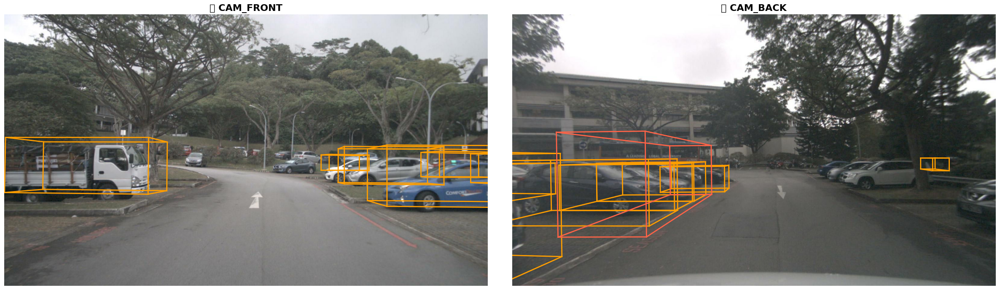

   Rank 2: 22 objects (Token: 55c258972acb4300a3a6077a531ab050)

🎬 Top 2 Scene (Objects: 22) | Sample Token: 55c258972acb4300a3a6077a531ab050


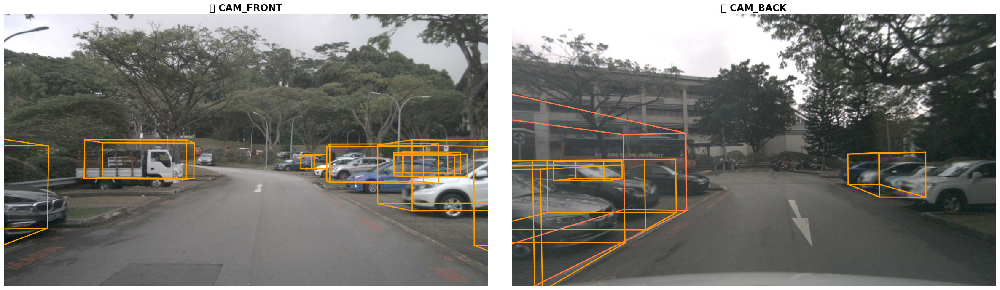

   Rank 3: 20 objects (Token: 7bebe3c9be714f02837f8617c56df122)

🎬 Top 3 Scene (Objects: 20) | Sample Token: 7bebe3c9be714f02837f8617c56df122


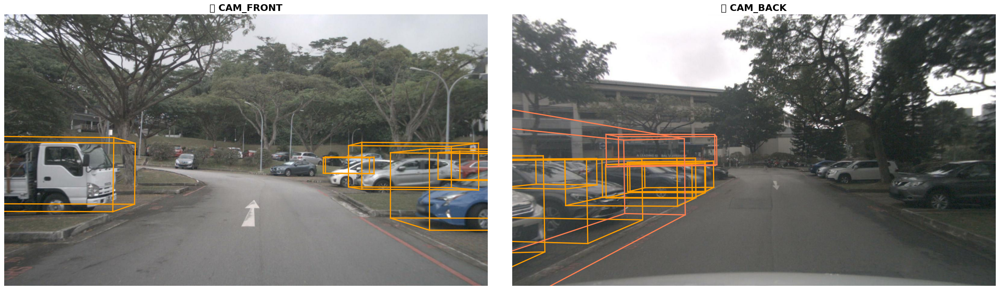

In [ ]:
import os
import sys
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import plotly.graph_objects as go

# ------------------------------------------------------------------------------
# 1. 라이브러리 및 데이터셋 로드 (중복 실행 방지)
# ------------------------------------------------------------------------------
DATA_ROOT = '/content/nuscenes'
JSON_PATH = "/content/drive/MyDrive/nuscenes_outputs/work_dirs/pointpillars_train_long/temp_results/epoch_30/pred_instances_3d/results_nusc.json"
VERSION = 'v1.0-mini'

# 라이브러리 체크
try:
    from nuscenes import NuScenes
    from nuscenes.utils.data_classes import Box
    from pyquaternion import Quaternion
    from nuscenes.utils.geometry_utils import view_points, box_in_image, BoxVisibility
except ImportError:
    print("⏳ 필수 라이브러리 설치 중...")
    os.system('pip install nuscenes-devkit plotly pandas matplotlib')
    from nuscenes import NuScenes
    from nuscenes.utils.data_classes import Box
    from pyquaternion import Quaternion
    from nuscenes.utils.geometry_utils import view_points, box_in_image, BoxVisibility

# 데이터셋 로드 체크
if 'nusc' in globals():
    print("✅ NuScenes 데이터가 이미 로드되어 있습니다.")
else:
    print("⏳ NuScenes 데이터 로딩 중...")
    if not os.path.exists(DATA_ROOT):
        import tarfile # (필요시 압축해제 로직 추가)

    try:
        nusc = NuScenes(version=VERSION, dataroot=DATA_ROOT, verbose=False)
        with open(JSON_PATH, 'r') as f:
            results = json.load(f)['results']
        print("✅ 데이터 로드 완료!")
    except Exception as e:
        print(f"❌ 데이터 로드 실패: {e}")

# ------------------------------------------------------------------------------
# 2. 유틸리티 함수
# ------------------------------------------------------------------------------
COLOR_MAP = {
    'car': (255, 158, 0), 'truck': (255, 99, 71), 'trailer': (255, 140, 0),
    'bus': (255, 127, 80), 'construction_vehicle': (233, 150, 122),
    'bicycle': (220, 20, 60), 'motorcycle': (255, 61, 99),
    'pedestrian': (0, 0, 230), 'traffic_cone': (47, 79, 79), 'barrier': (112, 128, 144)
}

def get_color(name, mode='rgb'):
    c = COLOR_MAP.get(name, (128, 128, 128))
    if mode == 'rgb': return np.array(c) / 255.0
    return '#%02x%02x%02x' % c

def get_boxes_in_sensor_frame(sample_token, sensor_token):
    if sample_token not in results: return [], None
    sd_record = nusc.get('sample_data', sensor_token)
    cs_record = nusc.get('calibrated_sensor', sd_record['calibrated_sensor_token'])
    pose_record = nusc.get('ego_pose', sd_record['ego_pose_token'])

    boxes = []
    for p in results[sample_token]:
        if p['detection_score'] < 0.25: continue
        box = Box(p['translation'], p['size'], Quaternion(p['rotation']),
                  score=p['detection_score'], name=p['detection_name'])
        box.translate(-np.array(pose_record['translation']))
        box.rotate(Quaternion(pose_record['rotation']).inverse)
        box.translate(-np.array(cs_record['translation']))
        box.rotate(Quaternion(cs_record['rotation']).inverse)
        boxes.append(box)
    return boxes, cs_record

# ------------------------------------------------------------------------------
# 3. 통합 시각화 함수 (이미지 크기 고정 기능 추가)
# ------------------------------------------------------------------------------
def visualize_custom_dashboard(sample_token, rank_info=""):
    sample = nusc.get('sample', sample_token)
    print(f"\n{'='*80}")
    print(f"🎬 {rank_info} | Sample Token: {sample_token}")
    print(f"{'='*80}")

    # [상단] 2개 카메라 뷰 (Front / Back)
    # figsize를 키워서 이미지가 더 크게 보이도록 설정
    fig, axes = plt.subplots(1, 2, figsize=(24, 8))
    plt.subplots_adjust(wspace=0.05, hspace=0, left=0.01, right=0.99, top=0.9, bottom=0.01)

    sensors_to_show = ['CAM_FRONT', 'CAM_BACK']

    for idx, sensor_name in enumerate(sensors_to_show):
        ax = axes[idx]
        sensor_token = sample['data'][sensor_name]

        # 이미지 로드
        cam_path = nusc.get_sample_data_path(sensor_token)
        img = Image.open(cam_path)
        W, H = img.size # 이미지의 실제 크기 (1600, 900)

        ax.imshow(img)
        ax.set_title(f"📷 {sensor_name}", fontsize=16, fontweight='bold')
        ax.axis('off')

        # ★ 핵심 수정: 그래프의 축을 이미지 크기에 강제로 고정 (Clipping)
        ax.set_xlim(0, W)
        ax.set_ylim(H, 0) # y축은 위에서 아래로(0->H)

        boxes, cs = get_boxes_in_sensor_frame(sample_token, sensor_token)
        if cs:
            cam_intrinsic = np.array(cs['camera_intrinsic'])
            for box in boxes:
                # 일단 이미지 영역 근처에 있는 박스만 처리
                if not box_in_image(box, cam_intrinsic, (W, H), vis_level=BoxVisibility.ANY):
                    continue

                c = get_color(box.name, 'rgb')
                corners = view_points(box.corners(), cam_intrinsic, normalize=True)[:2, :]

                def draw(pts, color):
                    prev = pts[-1]
                    for p in pts:
                        # 라인 그리기
                        ax.plot([prev[0], p[0]], [prev[1], p[1]], color=color, linewidth=2)
                        prev = p

                draw(corners.T[:4], c)
                draw(corners.T[4:], c)
                for k in range(4):
                    ax.plot([corners.T[k][0], corners.T[k+4][0]],
                            [corners.T[k][1], corners.T[k+4][1]], color=c, linewidth=2)
    plt.show()

    # [하단] 3D LiDAR Map (변동 없음)
    lidar_token = sample['data']['LIDAR_TOP']
    lidar_boxes, _ = get_boxes_in_sensor_frame(sample_token, lidar_token)

    lidar_path = nusc.get_sample_data_path(lidar_token)
    points = np.fromfile(lidar_path, dtype=np.float32).reshape(-1, 5)[:, :3]
    points = points[::5]

    layout_3d = go.Layout(
        title=f"🛰️ {rank_info} - LiDAR Interactive Map ({len(lidar_boxes)} Objects)",
        scene=dict(
            xaxis=dict(range=[-50, 50], backgroundcolor="black", title="X"),
            yaxis=dict(range=[-50, 50], backgroundcolor="black", title="Y"),
            zaxis=dict(range=[-3, 5], backgroundcolor="black", title="Z"),
            aspectmode='data'
        ),
        width=1000, height=700,
        paper_bgcolor="black", font=dict(color="white"),
        margin=dict(l=20, r=20, t=50, b=20)
    )

    fig_3d = go.Figure(layout=layout_3d)

    fig_3d.add_trace(go.Scatter3d(
        x=points[:, 0], y=points[:, 1], z=points[:, 2],
        mode='markers',
        marker=dict(size=1.2, color=points[:, 2], colorscale='Viridis', opacity=0.6),
        name='LiDAR Points'
    ))

    for box in lidar_boxes:
        corners = box.corners().T
        indices = [0, 1, 2, 3, 0, 4, 5, 6, 7, 4, 5, 1, 2, 6, 7, 3]
        lines = corners[indices]
        c_hex = get_color(box.name, 'hex')

        fig_3d.add_trace(go.Scatter3d(
            x=lines[:, 0], y=lines[:, 1], z=lines[:, 2],
            mode='lines',
            line=dict(color=c_hex, width=4),
            name=box.name
        ))

    fig_3d.show()

# ------------------------------------------------------------------------------
# 4. Top 3 실행 (순서 고정 버전)
# ------------------------------------------------------------------------------
if 'results' in globals():
    ranking = []
    for t in results.keys():
        # 임계값 0.25 이상인 박스 개수 세기
        count = len([b for b in results[t] if b['detection_score'] > 0.30])
        ranking.append((count, t))

    # [수정] 객체 수(x[0])로 먼저 정렬하고, 동점일 경우 토큰 문자열(x[1])로 정렬하여 순서 고정
    ranking.sort(key=lambda x: (x[0], x[1]), reverse=True)

    top_3 = ranking[:3]

    print(f"📊 총 {len(ranking)}개 샘플 중 상위 3개 추출")
    for i, (cnt, token) in enumerate(top_3):
        print(f"   Rank {i+1}: {cnt} objects (Token: {token})")
        visualize_custom_dashboard(token, rank_info=f"Top {i+1} Scene (Objects: {cnt})")
else:
    print("❌ 'results' 변수가 없습니다. 1번 셀부터 다시 실행해주세요.")

# 성능평가 코드

In [ ]:
import os
import matplotlib.pyplot as plt
from nuscenes.nuscenes import NuScenes
from nuscenes.eval.detection.config import config_factory
from nuscenes.eval.detection.evaluate import NuScenesEval

# =========================================================
# ⚙️ 설정 (경로를 본인 환경에 맞게 수정하세요)
# =========================================================
# 1. 데이터셋 경로 (v1.0-mini 폴더가 있는 곳)
# 보통 '/content/nuscenes' 또는 '/content/data/nuscenes' 입니다.
dataroot = '/content/nuscenes'

# 2. 평가할 모델의 JSON 결과 파일 경로
# 예: PointPillars 결과
result_json = "/content/drive/MyDrive/nuscenes_outputs/final_best_results2/results_nusc/pred_instances_3d/results_nusc.json"

# 3. 결과물이 저장될 폴더 이름
output_dir = "/content/drive/MyDrive/nuscenes_pointpilars_eval/"

# =========================================================
# 🚀 평가 실행 로직
# =========================================================
if not os.path.exists(dataroot):
    print(f"❌ 데이터셋 경로 오류: {dataroot} 가 없습니다.")
elif not os.path.exists(result_json):
    print(f"❌ 결과 파일 오류: {result_json} 가 없습니다.")
else:
    print(f"📄 채점 시작: {os.path.basename(result_json)}")

    # 1. NuScenes 객체 초기화
    nusc = NuScenes(version='v1.0-mini', dataroot=dataroot, verbose=True)

    # 2. 평가 설정 로드 (cvpr_2019 기준)
    cfg = config_factory('detection_cvpr_2019')

    # 3. 평가 도구 생성
    # eval_set='mini_val' (학습때 mini를 썼으면 검증도 mini로)
    nusc_eval = NuScenesEval(nusc,
                             config=cfg,
                             result_path=result_json,
                             eval_set='mini_val',
                             output_dir=output_dir,
                             verbose=True)

    # 4. 메인 평가 실행 (여기서 각종 수치 계산)
    # render_curves=True: PR-Curve 그래프를 그립니다.
    metrics_summary = nusc_eval.main(plot_examples=0, render_curves=True)

    print("\n" + "="*50)
    print("✅ 평가 완료! 주요 지표 요약")
    print("="*50)
    print(f"🏆 mAP (정확도 평균): {metrics_summary['mean_ap']:.4f}")
    print(f"🏆 NDS (종합 점수)  : {metrics_summary['nd_score']:.4f}")
    print("-" * 30)

    # 세부 클래스별 AP 출력
    for name, score in metrics_summary['mean_dist_aps'].items():
        print(f"   - {name:<20}: {score:.4f}")

    print(f"\n📂 상세 그래프 저장 위치: {output_dir}")

📄 채점 시작: results_nusc.json
Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 1.243 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.
Initializing nuScenes detection evaluation
Loaded results from /content/drive/MyDrive/nuscenes_outputs/final_best_results2/results_nusc/pred_instances_3d/results_nusc.json. Found detections for 81 samples.
Loading annotations for mini_val split from nuScenes version: v1.0-mini


100%|██████████| 81/81 [00:00<00:00, 406.97it/s]


Loaded ground truth annotations for 81 samples.
Filtering predictions
=> Original number of boxes: 35783
=> After distance based filtering: 35780
=> After LIDAR and RADAR points based filtering: 35780
=> After bike rack filtering: 35780
Filtering ground truth annotations
=> Original number of boxes: 4441
=> After distance based filtering: 3785
=> After LIDAR and RADAR points based filtering: 3393
=> After bike rack filtering: 3393
Accumulating metric data...
Calculating metrics...
Rendering PR and TP curves
Saving metrics to: /content/drive/MyDrive/nuscenes_pointpilars_eval/
mAP: 0.0369
mATE: 0.8031
mASE: 0.6861
mAOE: 1.0056
mAVE: 1.0076
mAAE: 0.6294
NDS: 0.1066
Eval time: 5.3s

Per-class results:
Object Class        	AP    	ATE   	ASE   	AOE   	AVE   	AAE   
car                 	0.260 	0.545 	0.230 	1.353 	0.640 	0.344 
truck               	0.008 	0.642 	0.385 	1.124 	0.833 	0.365 
bus                 	0.034 	0.722 	0.323 	0.089 	1.428 	0.122 
trailer             	0.000 	1.000 	1.000 

In [ ]:
import matplotlib.image as mpimg
import glob

# 위에서 설정한 output_dir 경로
target_dir = "/content/drive/MyDrive/nuscenes_pointpilars_eval/plots"

# PR-Curve 이미지 파일들 찾기
img_files = glob.glob(os.path.join(target_dir, "recall_precision_curve_*.png"))

if img_files:
    print(f"📊 {len(img_files)}개의 성능 그래프를 발견했습니다.\n")

    # 3개씩 묶어서 출력 (너무 길어지는 것 방지)
    for i in range(0, len(img_files), 3):
        fig, axes = plt.subplots(1, 3, figsize=(20, 6))

        for j in range(3):
            if i + j < len(img_files):
                img_path = img_files[i+j]
                img_name = os.path.basename(img_path).replace("recall_precision_curve_", "").replace(".png", "")

                img = mpimg.imread(img_path)
                axes[j].imshow(img)
                axes[j].set_title(f"Class: {img_name}", fontsize=15, fontweight='bold')
                axes[j].axis('off')
            else:
                axes[j].axis('off') # 빈 칸 숨기기
        plt.show()
else:
    print("⚠️ 생성된 그래프 이미지가 없습니다. 평가 코드를 먼저 실행해주세요.")

⚠️ 생성된 그래프 이미지가 없습니다. 평가 코드를 먼저 실행해주세요.


# 이미지 추출 후 영상 만들기

In [ ]:
import os
import shutil
import tarfile
import glob
import json
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import plotly.graph_objects as go

# ------------------------------------------------------------------------------
# 1. 필수 라이브러리 설치 및 임포트 (자동 확인)
# ------------------------------------------------------------------------------
try:
    from nuscenes import NuScenes
    from nuscenes.utils.data_classes import Box
    from pyquaternion import Quaternion
    from nuscenes.utils.geometry_utils import view_points, box_in_image, BoxVisibility
    print("✅ 필수 라이브러리가 이미 설치되어 있습니다.")
except ImportError:
    print("⏳ 필수 라이브러리 설치 중... (nuscenes-devkit, plotly, pandas, matplotlib)")
    os.system('pip install nuscenes-devkit plotly pandas matplotlib')
    from nuscenes import NuScenes
    from nuscenes.utils.data_classes import Box
    from pyquaternion import Quaternion
    from nuscenes.utils.geometry_utils import view_points, box_in_image, BoxVisibility
    print("✅ 설치 완료!")

# ------------------------------------------------------------------------------
# 2. 경로 및 데이터 설정
# ------------------------------------------------------------------------------
TGZ_PATH = "/content/drive/MyDrive/LIKE_LION/1st_project(3D object detection)/v1.0-mini.tgz"
EXTRACT_DIR = "/content/nuscenes"
JSON_PATH = "/content/drive/MyDrive/nuscenes_outputs/final_best_results/results_nusc/pred_instances_3d/results_nusc.json"
VERSION = 'v1.0-mini'

# ------------------------------------------------------------------------------
# 3. 데이터 압축 해제 (필요한 경우에만 실행)
# ------------------------------------------------------------------------------
if not os.path.exists(os.path.join(EXTRACT_DIR, 'samples')):
    print(f"📦 데이터셋 압축 해제 시작... ({TGZ_PATH})")
    os.makedirs(EXTRACT_DIR, exist_ok=True)
    try:
        with tarfile.open(TGZ_PATH, 'r:gz') as tar:
            tar.extractall(path=EXTRACT_DIR)
        print("✅ 압축 해제 완료!")

        # 폴더 구조 보정 (v1.0-mini 폴더가 중첩된 경우)
        found_samples = glob.glob(f"{EXTRACT_DIR}/**/samples", recursive=True)
        if found_samples:
            actual_samples_path = found_samples[0]
            parent_dir = os.path.dirname(actual_samples_path)
            if parent_dir != EXTRACT_DIR.rstrip('/'):
                print("⚠️ 폴더 구조 교정 중...")
                for item in os.listdir(parent_dir):
                    shutil.move(os.path.join(parent_dir, item), EXTRACT_DIR)
                print("✅ 폴더 구조 교정 완료!")
    except Exception as e:
        print(f"❌ 압축 해제 중 오류 발생: {e}")
else:
    print("✅ 데이터셋이 이미 준비되어 있습니다.")

# ------------------------------------------------------------------------------
# 4. NuScenes 및 결과 데이터 로드
# ------------------------------------------------------------------------------
print("⏳ NuScenes 데이터 로딩 중...")
nusc = NuScenes(version=VERSION, dataroot=EXTRACT_DIR, verbose=False)
with open(JSON_PATH, 'r') as f:
    results = json.load(f)['results']
print("✅ 데이터 로드 완료!")

# ------------------------------------------------------------------------------
# 5. 시각화 헬퍼 함수 정의
# ------------------------------------------------------------------------------
COLOR_MAP = {
    'car': (255, 158, 0), 'truck': (255, 99, 71), 'trailer': (255, 140, 0),
    'bus': (255, 127, 80), 'construction_vehicle': (233, 150, 122),
    'bicycle': (220, 20, 60), 'motorcycle': (255, 61, 99),
    'pedestrian': (0, 0, 230), 'traffic_cone': (47, 79, 79), 'barrier': (112, 128, 144)
}

def get_color(name, mode='rgb'):
    c = COLOR_MAP.get(name, (128, 128, 128))
    if mode == 'rgb': return np.array(c) / 255.0
    return f'rgb({c[0]},{c[1]},{c[2]})'

def get_boxes_in_sensor_frame(sample_token, sensor_token):
    sd_record = nusc.get('sample_data', sensor_token)
    cs_record = nusc.get('calibrated_sensor', sd_record['calibrated_sensor_token'])
    pose_record = nusc.get('ego_pose', sd_record['ego_pose_token'])

    boxes = []
    if sample_token in results:
        for p in results[sample_token]:
            if p['detection_score'] < 0.2: continue
            box = Box(p['translation'], p['size'], Quaternion(p['rotation']),
                      score=p['detection_score'], name=p['detection_name'])
            box.translate(-np.array(pose_record['translation']))
            box.rotate(Quaternion(pose_record['rotation']).inverse)
            box.translate(-np.array(cs_record['translation']))
            box.rotate(Quaternion(cs_record['rotation']).inverse)
            boxes.append(box)
    return boxes, cs_record

def visualize_ultimate_dashboard(sample_token, save_path=None):
    sample = nusc.get('sample', sample_token)

    # 6개 카메라 뷰 설정
    layout = [
        ['CAM_FRONT_LEFT', 'CAM_FRONT', 'CAM_FRONT_RIGHT'],
        ['CAM_BACK_LEFT',  'CAM_BACK',  'CAM_BACK_RIGHT']
    ]
    fig, axes = plt.subplots(2, 3, figsize=(24, 10))
    plt.subplots_adjust(wspace=0.05, hspace=0.15)

    for i in range(2):
        for j in range(3):
            sensor_name = layout[i][j]
            ax = axes[i][j]
            sensor_token = sample['data'][sensor_name]
            boxes, cs_record = get_boxes_in_sensor_frame(sample_token, sensor_token)
            cam_path = nusc.get_sample_data_path(sensor_token)
            img = Image.open(cam_path)
            ax.imshow(img)
            ax.set_title(sensor_name, fontsize=12, fontweight='bold')
            ax.axis('off')

            camera_intrinsic = np.array(cs_record['camera_intrinsic'])
            for box in boxes:
                if not box_in_image(box, camera_intrinsic, (1600, 900), vis_level=BoxVisibility.ANY):
                    continue
                corners_3d = box.corners()
                corners_2d = view_points(corners_3d, camera_intrinsic, normalize=True)[:2, :]
                c = get_color(box.name, 'rgb')

                # 박스 그리기
                def draw(corners, color):
                    prev = corners[-1]
                    for corner in corners:
                        ax.plot([prev[0], corner[0]], [prev[1], corner[1]], color=color, linewidth=2)
                        prev = corner
                draw(corners_2d.T[:4], c)
                draw(corners_2d.T[4:], c)
                for k in range(4):
                    ax.plot([corners_2d.T[k][0], corners_2d.T[k+4][0]],
                            [corners_2d.T[k][1], corners_2d.T[k+4][1]], color=c, linewidth=2)

    plt.suptitle(f"Sample Token: {sample_token}", fontsize=20)

    if save_path:
        plt.savefig(save_path)
        plt.close()
        print(f"💾 이미지 저장 완료: {save_path}")
    else:
        plt.show()

# ------------------------------------------------------------------------------
# 6. 실행
# ------------------------------------------------------------------------------
tokens = list(results.keys())
# 랜덤으로 하나 선택하여 실행
target = random.choice(tokens)
print(f"🎬 시각화 생성 중... (Token: {target})")
visualize_ultimate_dashboard(target)

In [ ]:
import os
import shutil
import tarfile
import glob
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image

# ------------------------------------------------------------------------------
# 1. 환경 설정 및 라이브러리 로드
# ------------------------------------------------------------------------------
try:
    from nuscenes import NuScenes
    from nuscenes.utils.data_classes import Box
    from pyquaternion import Quaternion
    from nuscenes.utils.geometry_utils import view_points, box_in_image, BoxVisibility
    print("✅ 라이브러리 준비 완료")
except ImportError:
    print("⏳ 라이브러리 설치 중...")
    os.system('pip install nuscenes-devkit plotly pandas matplotlib')
    from nuscenes import NuScenes
    from nuscenes.utils.data_classes import Box
    from pyquaternion import Quaternion
    from nuscenes.utils.geometry_utils import view_points, box_in_image, BoxVisibility

# ------------------------------------------------------------------------------
# 2. 경로 및 데이터 준비
# ------------------------------------------------------------------------------
TGZ_PATH = "/content/drive/MyDrive/LIKE_LION/1st_project(3D object detection)/v1.0-mini.tgz"
EXTRACT_DIR = "/content/nuscenes"
JSON_PATH = "/content/drive/MyDrive/nuscenes_outputs/final_best_results/results_nusc/pred_instances_3d/results_nusc.json"
VERSION = 'v1.0-mini'

if not os.path.exists(os.path.join(EXTRACT_DIR, 'samples')):
    print(f"📦 데이터 압축 해제 중... ({TGZ_PATH})")
    os.makedirs(EXTRACT_DIR, exist_ok=True)
    try:
        with tarfile.open(TGZ_PATH, 'r:gz') as tar:
            tar.extractall(path=EXTRACT_DIR)
        found_samples = glob.glob(f"{EXTRACT_DIR}/**/samples", recursive=True)
        if found_samples and os.path.dirname(found_samples[0]) != EXTRACT_DIR.rstrip('/'):
            parent = os.path.dirname(found_samples[0])
            for item in os.listdir(parent):
                shutil.move(os.path.join(parent, item), EXTRACT_DIR)
    except Exception as e:
        print(f"⚠️ 압축 해제 주의: {e}")

print("⏳ NuScenes & 결과 데이터 로딩 중...")
nusc = NuScenes(version=VERSION, dataroot=EXTRACT_DIR, verbose=False)
with open(JSON_PATH, 'r') as f:
    results = json.load(f)['results']
print("✅ 데이터 로드 완료!")

# ------------------------------------------------------------------------------
# 3. 시각화 유틸리티
# ------------------------------------------------------------------------------
COLOR_MAP = {
    'car': (255, 158, 0), 'truck': (255, 99, 71), 'trailer': (255, 140, 0),
    'bus': (255, 127, 80), 'construction_vehicle': (233, 150, 122),
    'bicycle': (220, 20, 60), 'motorcycle': (255, 61, 99),
    'pedestrian': (0, 0, 230), 'traffic_cone': (47, 79, 79), 'barrier': (112, 128, 144)
}

def get_color(name):
    c = COLOR_MAP.get(name, (128, 128, 128))
    return np.array(c) / 255.0

def get_boxes(sample_token, sensor_token):
    if sample_token not in results:
        return [], None
    sd_record = nusc.get('sample_data', sensor_token)
    cs_record = nusc.get('calibrated_sensor', sd_record['calibrated_sensor_token'])
    pose_record = nusc.get('ego_pose', sd_record['ego_pose_token'])

    boxes = []
    for p in results[sample_token]:
        if p['detection_score'] < 0.2: continue
        box = Box(p['translation'], p['size'], Quaternion(p['rotation']),
                  score=p['detection_score'], name=p['detection_name'])
        box.translate(-np.array(pose_record['translation']))
        box.rotate(Quaternion(pose_record['rotation']).inverse)
        box.translate(-np.array(cs_record['translation']))
        box.rotate(Quaternion(cs_record['rotation']).inverse)
        boxes.append(box)
    return boxes, cs_record

# ------------------------------------------------------------------------------
# 4. 꽉 찬 화면(Full Frame) 영상 생성 로직
# ------------------------------------------------------------------------------
def create_full_frame_video(output_filename='cam_front_full.mp4'):
    # Scene 찾기
    valid_scene = None
    for scene in nusc.scene:
        if scene['first_sample_token'] in results:
            valid_scene = scene
            break

    if not valid_scene:
        print("❌ 적절한 Scene을 찾지 못했습니다.")
        return

    # 프레임 토큰 수집
    tokens = []
    curr = valid_scene['first_sample_token']
    while curr:
        tokens.append(curr)
        curr = nusc.get('sample', curr)['next']

    # 첫 프레임으로 이미지 사이즈 확인 (설정용)
    first_sample = nusc.get('sample', tokens[0])
    first_cam_token = first_sample['data']['CAM_FRONT']
    first_img_path = nusc.get_sample_data_path(first_cam_token)
    w, h = Image.open(first_img_path).size

    # Matplotlib 설정: 여백 제거를 위한 핵심 부분
    dpi = 100
    fig = plt.figure(figsize=(w/dpi, h/dpi), dpi=dpi) # 이미지 크기에 딱 맞춘 Figure
    ax = fig.add_axes([0, 0, 1, 1]) # [left, bottom, width, height] -> 전체 100% 사용
    ax.axis('off')

    def update(frame_idx):
        ax.clear()
        ax.axis('off') # clear 할 때마다 축 꺼야 함

        token = tokens[frame_idx]
        sample = nusc.get('sample', token)
        sensor_token = sample['data']['CAM_FRONT']

        # 이미지 그리기
        img_path = nusc.get_sample_data_path(sensor_token)
        img = Image.open(img_path)
        ax.imshow(img)

        # 박스 그리기
        boxes, cs_record = get_boxes(token, sensor_token)
        if cs_record:
            camera_intrinsic = np.array(cs_record['camera_intrinsic'])
            for box in boxes:
                if not box_in_image(box, camera_intrinsic, (w, h), vis_level=BoxVisibility.ANY):
                    continue

                c = get_color(box.name)
                corners = view_points(box.corners(), camera_intrinsic, normalize=True)[:2, :]

                def draw(pts, color):
                    prev = pts[-1]
                    for p in pts:
                        ax.plot([prev[0], p[0]], [prev[1], p[1]], color=color, linewidth=2)
                        prev = p

                draw(corners.T[:4], c)
                draw(corners.T[4:], c)
                for k in range(4):
                    ax.plot([corners.T[k][0], corners.T[k+4][0]],
                            [corners.T[k][1], corners.T[k+4][1]], color=c, linewidth=2)

        # 프레임 정보 텍스트 (화면 구석에 작게)
        ax.text(20, 50, f"Frame: {frame_idx}/{len(tokens)}", color='white', fontsize=15, fontweight='bold')

    print(f"🎥 영상 생성 시작 ({w}x{h}, {len(tokens)} frames)...")
    ani = animation.FuncAnimation(fig, update, frames=len(tokens), interval=200)
    ani.save(output_filename, writer='ffmpeg', fps=5)
    plt.close()
    print(f"✅ 영상 저장 완료: {output_filename}")

create_full_frame_video()

✅ 라이브러리 준비 완료
⏳ NuScenes & 결과 데이터 로딩 중...
✅ 데이터 로드 완료!
🎥 영상 생성 시작 (1600x900, 40 frames)...
✅ 영상 저장 완료: cam_front_full.mp4
